# Code for Bachelor Thesis in Economics at Heidelberg University
## by Daniel Schäffer

## Imports:

In [1]:
import warnings
warnings.filterwarnings("ignore")

from functions import (plot_merra_data, plot_merra_data2,plot_ols_data, plot_simulation_comparison, create_population_array,
                      plot_gpw_data, create_population_weight_array,plot_stata_input_response_cont, plot_stata_input_response, plot_stata_input_response_cont_bodele, barplot_plausibility, create_population_df)

from functions import plot_stata_input_response
import os
import pickle
import numpy as np
import pandas as pd
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import matplotlib as mpl
import statsmodels.api as sm
import cmocean
import cmocean.cm as cmo


In [2]:
mpl.font_manager._rebuild()
# Use Open Sans font family for all text.
plt.rc('font', family='Open Sans')
plt.rcParams['figure.dpi'] = 150

In [3]:
parent_directory = os.path.abspath(os.path.join(os.path.dirname(os.path.realpath("__file__")), os.pardir))

# 3. Empirical Strategy

## 3.3 Model Implementation

### Data

In [4]:
with open(parent_directory + '\\processed_data\\daily_novapr_indices', 'rb') as pickle_file:
        daily_novapr_indices = pickle.load(pickle_file)

with open(parent_directory + '\\processed_data\\daily_junsep_indices', 'rb') as pickle_file:
        daily_junsep_indices = pickle.load(pickle_file)


In [5]:
west_africa_longitudes = np.load(parent_directory + '\\processed_data\\west_africa_longitudes.npy')
west_africa_latitudes = np.load(parent_directory + '\\processed_data\\west_africa_latitudes.npy')

In [6]:
dust_daily_data = np.load(parent_directory + '\\processed_data\\dust_daily_data.npy') 
dust_daily_data_novapr = np.load(parent_directory + '\\processed_data\\dust_daily_data_novapr.npy') 
dust_daily_data_junsep = np.load(parent_directory + '\\processed_data\\dust_daily_data_junsep.npy') 

In [7]:

#contemporary response

aod_pwt_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_aodl0_response.csv')
aod_mpd_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_aodl0_response.csv')
aod_wbdi_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_aodl0_response.csv')

aod_pwt_sim_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_sim_aodl0_response.csv')
aod_mpd_sim_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_sim_aodl0_response.csv')
aod_wbdi_sim_aodl0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_sim_aodl0_response.csv')

pm25_pwt_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_pm25l0_response.csv')
pm25_mpd_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_pm25l0_response.csv')
pm25_wbdi_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_pm25l0_response.csv')

pm25_pwt_sim_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_sim_pm25l0_response.csv')
pm25_mpd_sim_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_sim_pm25l0_response.csv')
pm25_wbdi_sim_pm25l0_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_sim_pm25l0_response.csv')


# aod/pm25

aod_pwt_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_aod_response.csv')
aod_mpd_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_aod_response.csv')
aod_wbdi_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_aod_response.csv')
aod_pwt_sim_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_sim_aod_response.csv')
aod_mpd_sim_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_sim_aod_response.csv')
aod_wbdi_sim_aod_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_sim_aod_response.csv')

pm25_pwt_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\\pm25_pwt_pm25_response.csv')
pm25_mpd_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_pm25_response.csv')
pm25_wbdi_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_pm25_response.csv')
pm25_pwt_sim_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_sim_pm25_response.csv')
pm25_mpd_sim_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_sim_pm25_response.csv')
pm25_wbdi_sim_pm25_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_sim_pm25_response.csv')


# prec:

aod_pwt_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_prec_response.csv')
aod_mpd_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_prec_response.csv')
aod_wbdi_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_prec_response.csv')
aod_pwt_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_sim_prec_response.csv')
aod_mpd_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_sim_prec_response.csv')
aod_wbdi_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_sim_prec_response.csv')

pm25_pwt_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_prec_response.csv')
pm25_mpd_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_prec_response.csv')
pm25_wbdi_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_prec_response.csv')
pm25_pwt_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_sim_prec_response.csv')
pm25_mpd_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_sim_prec_response.csv')
pm25_wbdi_sim_prec_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_sim_prec_response.csv')


#temp:

aod_pwt_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_temp_response.csv')
aod_mpd_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_temp_response.csv')
aod_wbdi_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_temp_response.csv')
aod_pwt_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_sim_temp_response.csv')
aod_mpd_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_sim_temp_response.csv')
aod_wbdi_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_sim_temp_response.csv')

pm25_pwt_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_temp_response.csv')
pm25_mpd_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_temp_response.csv')
pm25_wbdi_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_temp_response.csv')
pm25_pwt_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_sim_temp_response.csv')
pm25_mpd_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_sim_temp_response.csv')
pm25_wbdi_sim_temp_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_sim_temp_response.csv')


#robustness

#aod response

aod_bodele_dryl0l1_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_bodele_dryl0l1_response.csv')
aod_bodele_wetl0l1_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_bodele_wetl0l1_response.csv')

aod_pwt_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_backward_response.csv')
aod_mpd_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_backward_response.csv')
aod_wbdi_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_backward_response.csv')

aod_pwt_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_pwt_backward_response_sim.csv')
aod_mpd_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_mpd_backward_response_sim.csv')
aod_wbdi_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\aod_wbdi_backward_response_sim.csv')


# pm25 response

pm25_bodele_dryl0l1_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_bodele_dryl0l1_response.csv')
pm25_bodele_wetl0l1_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_bodele_wetl0l1_response.csv')

pm25_pwt_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_backward_response.csv')
pm25_mpd_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_backward_response.csv')
pm25_wbdi_backward_response = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_backward_response.csv')

pm25_pwt_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_pwt_backward_response_sim.csv')
pm25_mpd_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_mpd_backward_response_sim.csv')
pm25_wbdi_backward_response_sim = pd.read_csv(parent_directory + '\\Code\\Stata\\pm25_wbdi_backward_response_sim.csv')

First specification, Togo Dust regression

In [8]:
togo_dust_reg_df = pd.read_csv(parent_directory + '\\processed_data\\togo_dust_reg_df.csv', index_col=[0])

In [9]:
togo_dust_reg_model = sm.OLS(togo_dust_reg_df.iloc[: ,0], sm.add_constant(togo_dust_reg_df.iloc[: , 1:])).fit(cov_type='HC1')
togo_dust_reg_model_novapr = sm.OLS(togo_dust_reg_df[(togo_dust_reg_df['dry_season']==True)].iloc[: , 0], sm.add_constant(togo_dust_reg_df[(togo_dust_reg_df['dry_season']==True)].iloc[: , 3:])).fit(cov_type='HC1')
togo_dust_reg_model_junsep = sm.OLS(togo_dust_reg_df[(togo_dust_reg_df['wet_season']==True)].iloc[: , 0], sm.add_constant(togo_dust_reg_df[(togo_dust_reg_df['wet_season']==True)].iloc[: , 3:])).fit(cov_type='HC1')

In [10]:
np.std(togo_dust_reg_df['togo_coast_dust'])

3.7301769948162105e-08

In [11]:
togo_dust_reg_model.summary()

c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\statsmodels\base\model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 15, but rank is 12
  'rank is %d' % (J, J_), ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        togo_coast_dust   R-squared:                       0.494
Model:                            OLS   Adj. R-squared:                  0.494
Method:                 Least Squares   F-statistic:                     154.9
Date:                Mon, 18 Jul 2022   Prob (F-statistic):               0.00
Time:                        22:37:09   Log-Likelihood:             2.1642e+05
No. Observations:               13504   AIC:                        -4.328e+05
Df Residuals:                   13488   BIC:                        -4.327e+05
Df Model:                          15                                         
Covariance Type:                  HC1                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          8.468e-07   1.18e-07      7.162      0.000    6.15e-07    1.08e-06
wet_season     1.856e-09   6.13e-10      3.028      0.002    6.54e-10    3.06e-09
dry_season     1.715e-08    6.3e-10     27.245      0.000    1.59e-08    1.84e-08
bod_dust_t-0      0.0395      0.006      6.638      0.000       0.028       0.051
bod_dust_t-1      0.0123      0.009      1.400      0.162      -0.005       0.030
bod_dust_t-2      0.0557      0.010      5.382      0.000       0.035       0.076
bod_dust_t-3      0.0716      0.012      5.808      0.000       0.047       0.096
bod_dust_t-4      0.0543      0.013      4.036      0.000       0.028       0.081
bod_dust_t-5      0.0471      0.013      3.656      0.000       0.022       0.072
bod_dust_t-6      0.0373      0.012      3.161      0.002       0.014       0.060
bod_dust_t-7      0.0246      0.011      2.250      0.024       0.003       0.046
bod_dust_t-8      0.0207      0.010      2.050      0.040       0.001       0.041
bod_dust_t-9      0.0074      0.009      0.823      0.410      -0.010       0.025
bod_dust_t-10     0.0285      0.006      4.887      0.000       0.017       0.040
precipitation -3.495e-05   3.02e-06    -11.592      0.000   -4.09e-05    -2.9e-05
temperature    -2.99e-09   3.98e-10     -7.519      0.000   -3.77e-09   -2.21e-09
==============================================================================
Omnibus:                    13045.698   Durbin-Watson:                   0.322
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1316881.727
Skew:                           4.439   Prob(JB):                         0.00
Kurtosis:                      50.556   Cond. No.                     1.81e+10
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The smallest eigenvalue is 3.69e-12. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [12]:
togo_dust_reg_model_novapr.summary()

c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\statsmodels\base\model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 13, but rank is 12
  'rank is %d' % (J, J_), ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        togo_coast_dust   R-squared:                       0.419
Model:                            OLS   Adj. R-squared:                  0.418
Method:                 Least Squares   F-statistic:                     173.9
Date:                Mon, 18 Jul 2022   Prob (F-statistic):               0.00
Time:                        22:37:09   Log-Likelihood:             1.0552e+05
No. Observations:                6696   AIC:                        -2.110e+05
Df Residuals:                    6682   BIC:                        -2.109e+05
Df Model:                          13                                         
Covariance Type:                  HC1                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1.469e-06   1.92e-07      7.652      0.000    1.09e-06    1.85e-06
bod_dust_t-0      0.0520      0.008      6.644      0.000       0.037       0.067
bod_dust_t-1      0.0147      0.012      1.245      0.213      -0.008       0.038
bod_dust_t-2      0.0731      0.014      5.252      0.000       0.046       0.100
bod_dust_t-3      0.0928      0.016      5.654      0.000       0.061       0.125
bod_dust_t-4      0.0696      0.018      3.883      0.000       0.034       0.105
bod_dust_t-5      0.0604      0.017      3.527      0.000       0.027       0.094
bod_dust_t-6      0.0489      0.016      3.113      0.002       0.018       0.080
bod_dust_t-7      0.0322      0.015      2.203      0.028       0.004       0.061
bod_dust_t-8      0.0262      0.014      1.928      0.054      -0.000       0.053
bod_dust_t-9      0.0104      0.012      0.864      0.387      -0.013       0.034
bod_dust_t-10     0.0357      0.008      4.618      0.000       0.021       0.051
precipitation -8.424e-05    1.2e-05     -7.030      0.000      -0.000   -6.08e-05
temperature   -5.077e-09   6.42e-10     -7.911      0.000   -6.33e-09   -3.82e-09
==============================================================================
Omnibus:                     5008.441   Durbin-Watson:                   0.361
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           187530.036
Skew:                           3.197   Prob(JB):                         0.00
Kurtosis:                      28.125   Cond. No.                     1.56e+10
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The smallest eigenvalue is 2.48e-12. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [13]:
togo_dust_reg_model_junsep.summary()

c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\statsmodels\base\model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 13, but rank is 12
  'rank is %d' % (J, J_), ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        togo_coast_dust   R-squared:                       0.244
Model:                            OLS   Adj. R-squared:                  0.241
Method:                 Least Squares   F-statistic:                     31.82
Date:                Mon, 18 Jul 2022   Prob (F-statistic):           3.77e-71
Time:                        22:37:10   Log-Likelihood:                 82492.
No. Observations:                4514   AIC:                        -1.650e+05
Df Residuals:                    4500   BIC:                        -1.649e+05
Df Model:                          13                                         
Covariance Type:                  HC1                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.493e-07   1.59e-08    -21.969      0.000    -3.8e-07   -3.18e-07
bod_dust_t-0      0.0006      0.001      0.391      0.696      -0.002       0.003
bod_dust_t-1      0.0027      0.002      1.438      0.150      -0.001       0.006
bod_dust_t-2      0.0044      0.002      2.013      0.044       0.000       0.009
bod_dust_t-3      0.0068      0.002      2.839      0.005       0.002       0.011
bod_dust_t-4      0.0054      0.002      2.229      0.026       0.001       0.010
bod_dust_t-5      0.0057      0.003      2.150      0.032       0.001       0.011
bod_dust_t-6      0.0039      0.002      1.628      0.104      -0.001       0.009
bod_dust_t-7      0.0025      0.002      1.183      0.237      -0.002       0.007
bod_dust_t-8      0.0014      0.002      0.708      0.479      -0.003       0.005
bod_dust_t-9      0.0031      0.002      1.445      0.148      -0.001       0.007
bod_dust_t-10     0.0024      0.002      1.469      0.142      -0.001       0.006
precipitation  2.183e-06   6.06e-07      3.603      0.000    9.95e-07    3.37e-06
temperature    1.168e-09   5.34e-11     21.872      0.000    1.06e-09    1.27e-09
==============================================================================
Omnibus:                     2797.595   Durbin-Watson:                   0.751
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            43989.574
Skew:                           2.694   Prob(JB):                         0.00
Kurtosis:                      17.313   Cond. No.                     2.74e+10
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The smallest eigenvalue is 5.35e-13. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [14]:
def plot_regression_coefficients(coefficient_array, lower_end, upper_end, y_name= '', x_name = '', title=f'', fig_size=(16,8)):
    fig, ax = plt.subplots()

    ax.plot(range(coefficient_array.shape[0]), coefficient_array,"-", label="Response", linewidth= .5)
    ax.fill_between(range(coefficient_array.shape[0]), (lower_end), (upper_end), color='b', alpha=.1)
    # ax.fill_between(coefficient_array, (coefficient_array.shape[0]-lower_end), (coefficient_array.shape[0]+upper_end), color='b', alpha=.1)
    # ax.plot(range(real_data.shape[0]), predicted_values,"--", label="OLS Predicted Values", linewidth= .8)
    fig.set_size_inches(fig_size)

In [15]:
togo_dust_reg_model_novapr.summary().tables[1]

,coef,std err,z,P>|z|,[0.025,0.975]
const,1.469e-06,1.92e-07,7.652,0.000,1.09e-06,1.85e-06
bod_dust_t-0,0.0520,0.008,6.644,0.000,0.037,0.067
bod_dust_t-1,0.0147,0.012,1.245,0.213,-0.008,0.038
bod_dust_t-2,0.0731,0.014,5.252,0.000,0.046,0.100
bod_dust_t-3,0.0928,0.016,5.654,0.000,0.061,0.125
bod_dust_t-4,0.0696,0.018,3.883,0.000,0.034,0.105
bod_dust_t-5,0.0604,0.017,3.527,0.000,0.027,0.094
bod_dust_t-6,0.0489,0.016,3.113,0.002,0.018,0.080
bod_dust_t-7,0.0322,0.015,2.203,0.028,0.004,0.061
bod_dust_t-8,0.0262,0.014,1.928,0.054,-0.000,0.053


In [16]:
togo_dust_reg_predictions = togo_dust_reg_model.predict(sm.add_constant(togo_dust_reg_df.iloc[: , 1:]))
togo_dust_reg_novapr_predictions = togo_dust_reg_model_novapr.predict(sm.add_constant(togo_dust_reg_df[(togo_dust_reg_df['dry_season']==True)].iloc[: , 3:]))
togo_dust_reg_junsep_predictions = togo_dust_reg_model_junsep.predict(sm.add_constant(togo_dust_reg_df[(togo_dust_reg_df['wet_season']==True)].iloc[: , 3:]))

In [17]:
plt.rcParams['figure.dpi'] = 200

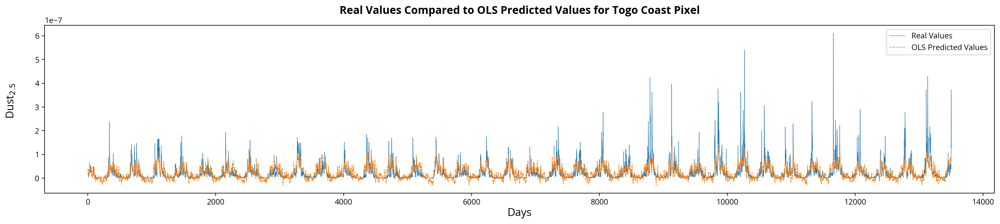

In [18]:
plot_ols_data(togo_dust_reg_df, togo_dust_reg_predictions, y_name= 'Dust$_{2.5}}$', x_name = 'Days', title='Real Values Compared to OLS Predicted Values for Togo Coast Pixel', fig_size=(22,4))

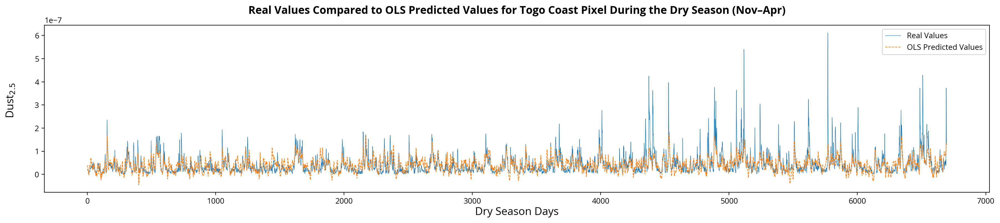

In [19]:
plot_ols_data(togo_dust_reg_df[(togo_dust_reg_df['dry_season']==True)], togo_dust_reg_novapr_predictions, y_name= 'Dust$_{2.5}}$', x_name = 'Dry Season Days',
              title='Real Values Compared to OLS Predicted Values for Togo Coast Pixel During the Dry Season (Nov–Apr)', fig_size=(22,4))

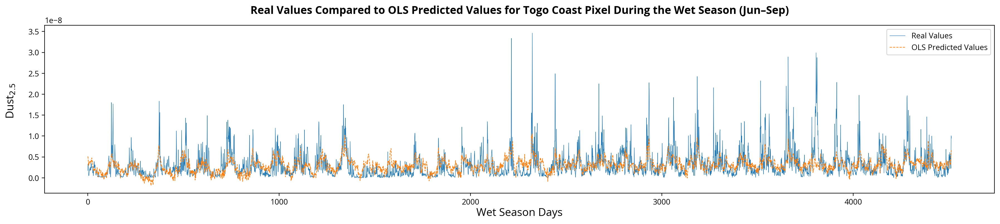

In [20]:
plot_ols_data(togo_dust_reg_df[(togo_dust_reg_df['wet_season']==True)], togo_dust_reg_junsep_predictions, y_name= 'Dust$_{2.5}}$', x_name = 'Wet Season Days',
              title='Real Values Compared to OLS Predicted Values for Togo Coast Pixel During the Wet Season (Jun–Sep)', fig_size=(22,4))

In [21]:
plt.rcParams['figure.dpi'] = 150

First specification, Predicted daily dust data

In [22]:
predicted_daily_dust_data = np.load(parent_directory + '\\processed_data\\predicted_daily_dust_data.npy')
predicted_daily_dust_data_dry = np.load(parent_directory + '\\processed_data\\predicted_daily_dust_data_dry.npy')
predicted_daily_dust_data_wet = np.load(parent_directory + '\\processed_data\\predicted_daily_dust_data_wet.npy')
r_squared_map = np.load(parent_directory + '\\processed_data\\r_squared_map.npy')
r_squared_map_dry = np.load(parent_directory + '\\processed_data\\r_squared_map_dry.npy')
r_squared_map_wet = np.load(parent_directory + '\\processed_data\\r_squared_map_wet.npy')
mse_array = np.load(parent_directory + '\\processed_data\\mse_array.npy')
mse_array_dry = np.load(parent_directory + '\\processed_data\\mse_array_dry.npy')
mse_array_wet = np.load(parent_directory + '\\processed_data\\mse_array_wet.npy')

simulated_dustmass_hourly_data = np.load(parent_directory + '\\processed_data\\simulated_dustmass_hourly_data.npy')

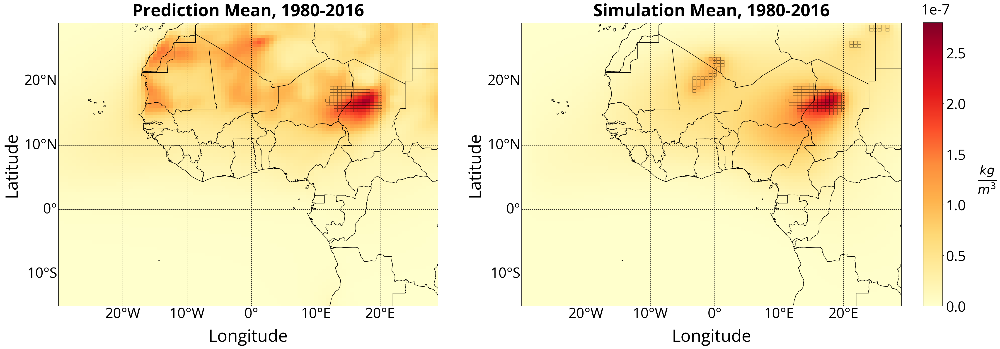

In [23]:
plot_simulation_comparison([(np.sum(predicted_daily_dust_data, axis = 0)/predicted_daily_dust_data.shape[0])*10**7, (np.sum(simulated_dustmass_hourly_data, axis = 0)/simulated_dustmass_hourly_data.shape[0])* 10**7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['Prediction Mean, ',
                        'Simulation Mean, '],
                date=['1980-2016', '1980-2016'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = True,
                add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.25,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.8,2.8],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[2.85,2.85], lat_space = [-.1,-.1], lon_space=[-.14,-.14], stat_model=True)

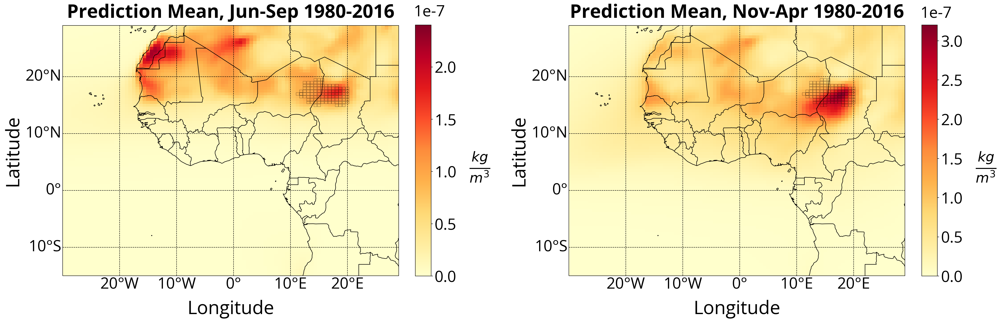

In [24]:
plot_merra_data2([(np.sum(predicted_daily_dust_data_wet, axis = 0)/predicted_daily_dust_data_wet.shape[0])*10 ** 7, 
                (np.sum(predicted_daily_dust_data_dry, axis = 0)/predicted_daily_dust_data_dry.shape[0])*10 ** 7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['Prediction Mean, ',
                        'Prediction Mean, '],
                date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = True, source_region_alpha = 1, source_region_color='black', source_region_lw=.25,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.4,3.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[2.45,3.25], lat_space = [-.12,-.12], lon_space=[-.17,-.17])

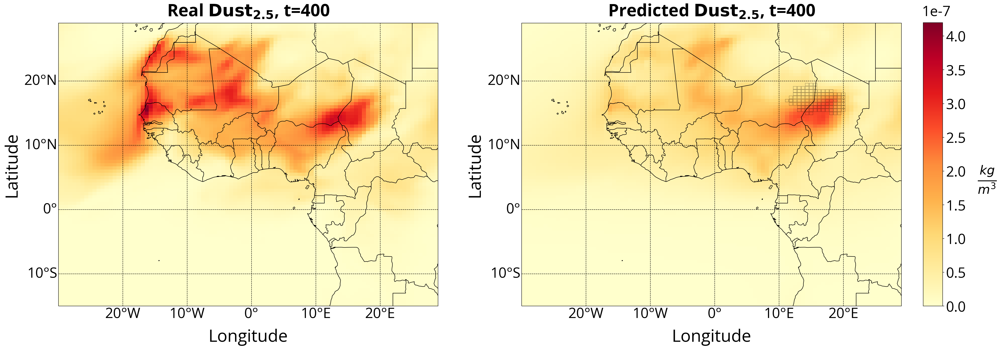

In [25]:
plot_simulation_comparison([(dust_daily_data[400])*10 ** 7, (predicted_daily_dust_data[400])*10 ** 7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['Real $\mathbf{Dust_{2.5}}$, ', 'Predicted $\mathbf{Dust_{2.5}}$, '],
                date=['t=400', 't=400'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = True, source_region_alpha = 1, source_region_color='black', source_region_lw=.25,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [4.2,4.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[4.25,4.25], lat_space = [-.1,-.1], lon_space=[-.14,-.14], stat_model=False)

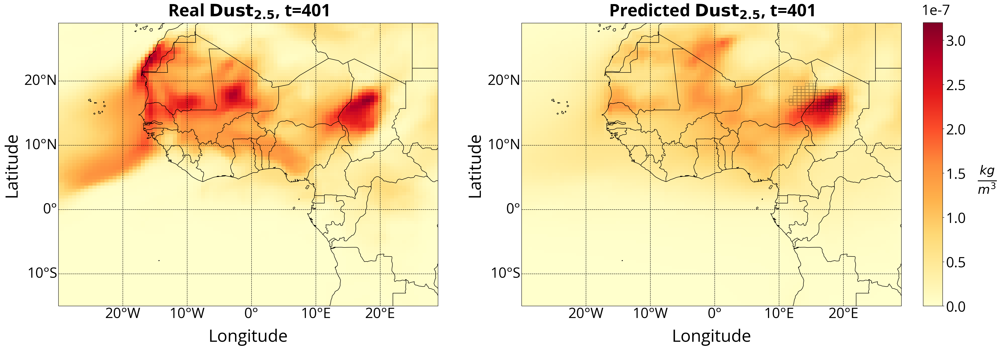

In [26]:
plot_simulation_comparison([(dust_daily_data[401])*10 ** 7, (predicted_daily_dust_data[401])*10 ** 7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['Real $\mathbf{Dust_{2.5}}$, ', 'Predicted $\mathbf{Dust_{2.5}}$, '],
                date=['t=401', 't=401'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'],
                extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = True, source_region_alpha = 1, source_region_color='black', source_region_lw=.25,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [3.2,3.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[3.25,3.25], lat_space = [-.1,-.1], lon_space=[-.14,-.14], stat_model=False)

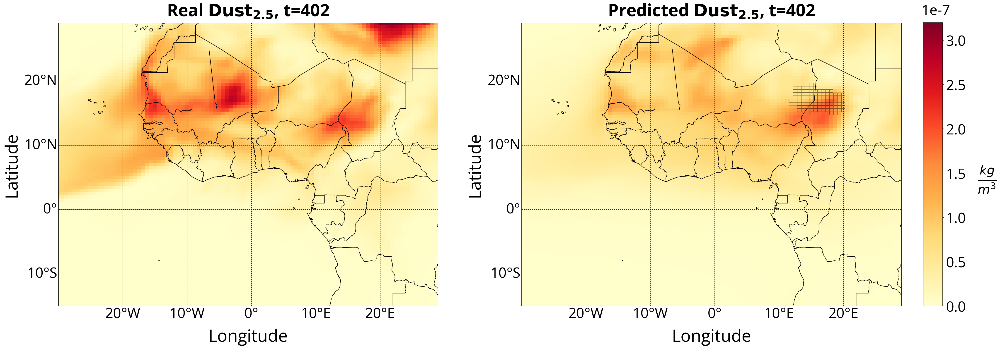

In [27]:
plot_simulation_comparison([(dust_daily_data[402])*10 ** 7, (predicted_daily_dust_data[402])*10 ** 7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['Real $\mathbf{Dust_{2.5}}$, ', 'Predicted $\mathbf{Dust_{2.5}}$, '],
                date=['t=402', 't=402'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = True, source_region_alpha = 1, source_region_color='black', source_region_lw=.25,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [3.2,3.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[3.25,3.25], lat_space = [-.1,-.1], lon_space=[-.14,-.14], stat_model=False)

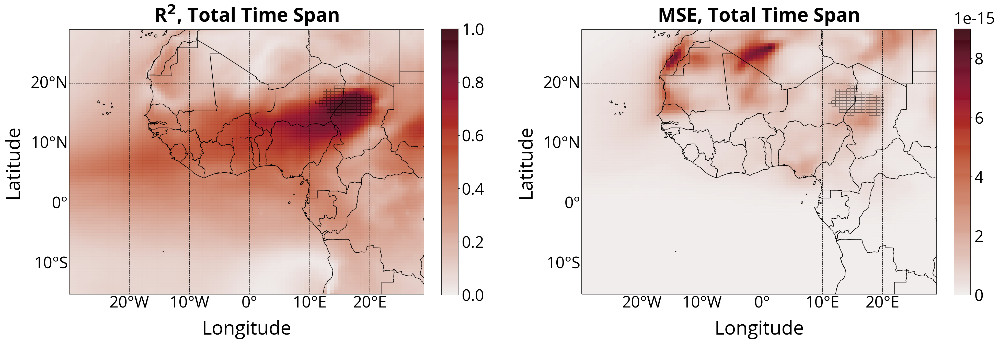

In [28]:
plot_merra_data2([r_squared_map, mse_array*10 ** 15],
                west_africa_longitudes, west_africa_latitudes,
                titles=[r'R$^{\mathbf{2}}$, ',
                        'MSE, '],
                date=['Total Time Span', 'Total Time Span'], data_values=[r'', ''] , extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False, cb_frac=False,
                add_bodele_source_exclusive = True, source_region_alpha = .6, source_region_color='black', source_region_lw=.25, source_region_fill= False,
                cbar_color = [cmocean.tools.lighten(cmo.amp, .95),cmocean.tools.lighten(cmo.amp, .95)], cbar_min = [0,0], cbar_max = [1,9],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.575, labelsize = 14,
                text_size = 36, value_size=30,
                scientific_unit='1e-15',scientific_y =[1,9.05], w_space=.17, lon_space=[-0.17,-.17], lat_space=[-.13, -.13], scientific=True, one_scientific=True)

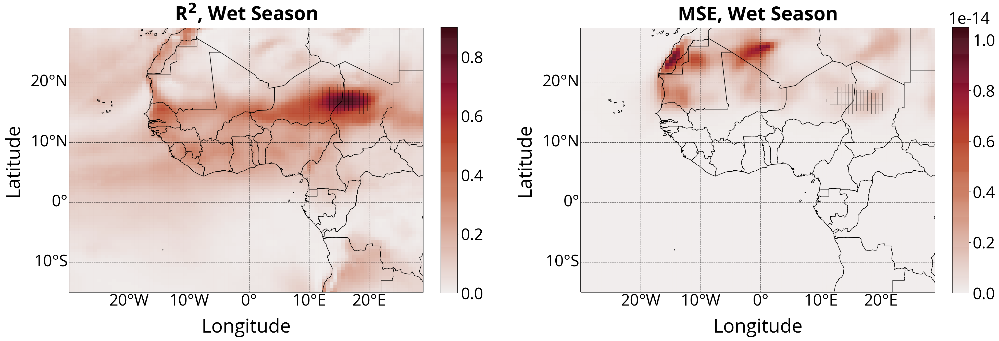

In [29]:
plot_merra_data2([r_squared_map_wet, mse_array_wet*10 ** 14],
                west_africa_longitudes, west_africa_latitudes,
                titles=[r'R$^{\mathbf{2}}$, ',
                        'MSE, '],
                date=['Wet Season', 'Wet Season'], data_values=[r'', ''] , extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False, cb_frac=False,
                add_bodele_source_exclusive = True, source_region_alpha = .6, source_region_color='black', source_region_lw=.25, source_region_fill= False,
                cbar_color = [cmocean.tools.lighten(cmo.amp, .95),cmocean.tools.lighten(cmo.amp, .95)], cbar_min = [0,0], cbar_max = [.9,1.05],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.575, labelsize = 14,
                text_size = 36, value_size=30,
                scientific_unit='1e-14',scientific_y =[.905,1.05], w_space=.17, lon_space=[-0.17,-.17], lat_space=[-.13, -.13], scientific=True, one_scientific=True)

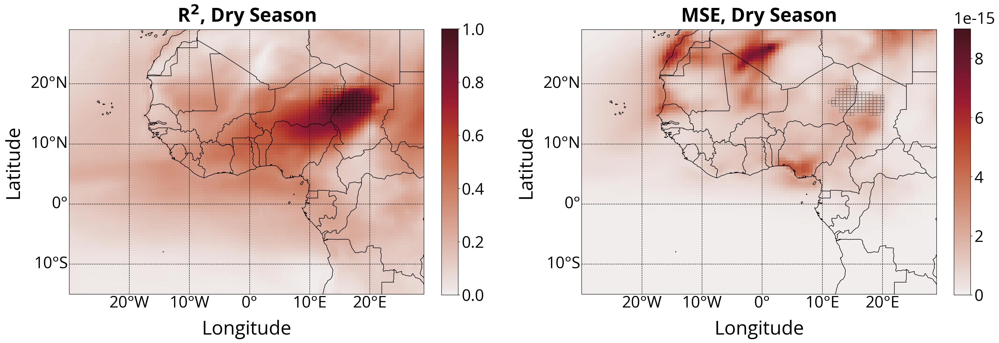

In [30]:
plot_merra_data2([r_squared_map_dry, mse_array_dry*10 ** 15],
                west_africa_longitudes, west_africa_latitudes,
                titles=[r'R$^{\mathbf{2}}$, ',
                        'MSE, '],
                date=['Dry Season', 'Dry Season'], data_values=[r'', ''] , extent=[-30,29,-15,29],
                borders = True, bodele = False, plot_grids = True, add_source_region = False, cb_frac=False,
                add_bodele_source_exclusive = True, source_region_alpha = .6, source_region_color='black', source_region_lw=.25, source_region_fill= False,
                cbar_color = [cmocean.tools.lighten(cmo.amp, .95),cmocean.tools.lighten(cmo.amp, .95)], cbar_min = [0,0], cbar_max = [1,9],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.575, labelsize = 14,
                text_size = 36, value_size=30,
                scientific_unit='1e-15',scientific_y =[1,9.05], w_space=.17, lon_space=[-0.17,-.17], lat_space=[-.13, -.13], scientific=True, one_scientific=True)

weighted predicted dust:

In [31]:
benin_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ben.csv')
burkina_faso_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_bfa.csv')
gambia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gmb.csv')
ghana_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gha.csv')
guinea_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gin.csv')
liberia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_lbr.csv')
mali_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_mli.csv')
niger_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ner.csv')
nigeria_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_nga.csv')
sierra_leone_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sle.csv')
senegal_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sen.csv')
togo_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_tgo.csv')

In [32]:
population_array = np.load(parent_directory + '\\processed_data\\population_array.npy')

temp_pop_array = population_array.copy()
# population_weigth_array = create_population_weight_array_old(temp_pop_array)
population_weigth_array = create_population_weight_array(temp_pop_array, ['benin', 'burkina_faso', 'gambia', 'ghana',
                                                                            'guinea', 'liberia','mali', 'niger', 'nigeria',
                                                                            'senegal', 'sierra_leone', 'togo'])

#create population weight array that only takes the pixels where there actually exists populaton data, the others are set to 'NaN'
country_population_weigth_array = population_weigth_array
country_population_weigth_array[country_population_weigth_array == 0] = float("NaN")

In [33]:
predicted_daily_dust_data_country_weighted = predicted_daily_dust_data * country_population_weigth_array

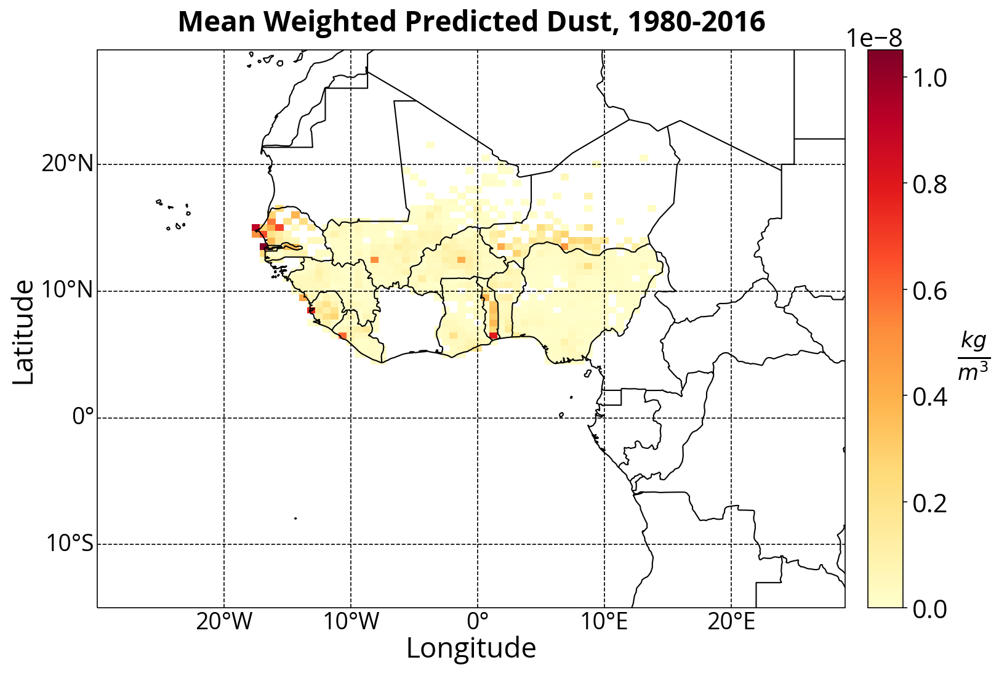

In [34]:
plot_merra_data(np.sum(predicted_daily_dust_data_country_weighted, axis = 0)/predicted_daily_dust_data_country_weighted.shape[0],
                west_africa_longitudes, west_africa_latitudes, title='Mean Weighted Predicted Dust, ',
                date='1980-2016', data_value=r'$\frac{kg}{m^3}$', extent=[-30,29,-15,29], borders = True,
                bodele = False, plot_grids = True, cbar_max = 1.05, unit = 10 ** -8,shrink=1,text_size=22, tick_size=20, labelsize=18, ax_text_left = -0.08, rot=0, data_value_label = 20)

Effects on GDP:

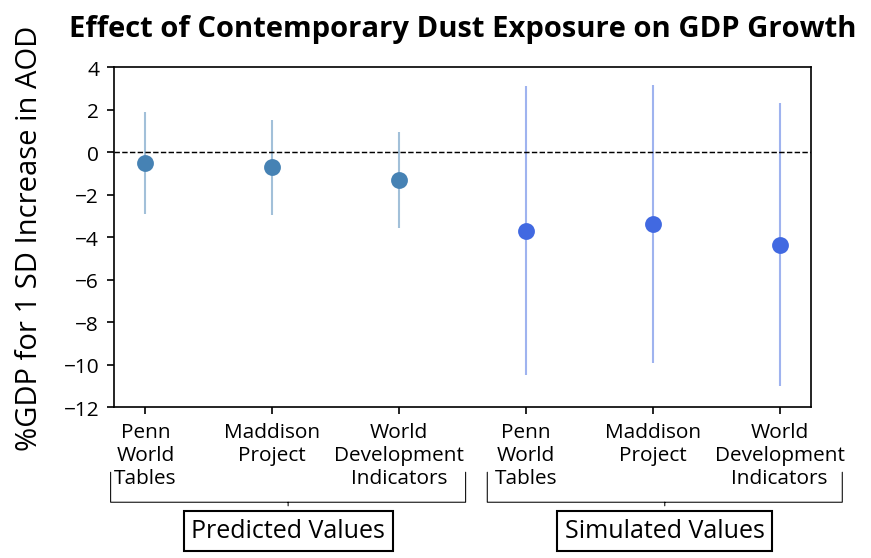

In [35]:
plot_stata_input_response_cont([aod_pwt_aodl0_response, aod_mpd_aodl0_response, aod_wbdi_aodl0_response,
                                 aod_pwt_sim_aodl0_response, aod_mpd_sim_aodl0_response, aod_wbdi_sim_aodl0_response],
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables', 'Maddison\nProject', 'World\nDevelopment\nIndicators','Penn\nWorld\nTables', 'Maddison\nProject', 'World\nDevelopment\nIndicators'],
                          main_title= r'Effect of Contemporary Dust Exposure on GDP Growth', colors=["steelblue","steelblue", "steelblue","royalblue","royalblue", "royalblue"], fig_size=(6,3), ylim=[-12,4])

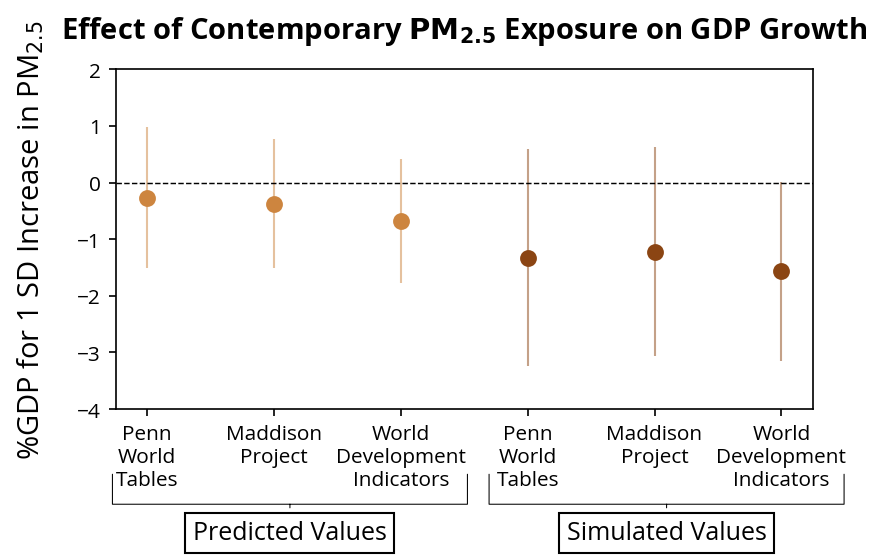

In [36]:
plot_stata_input_response_cont([pm25_pwt_pm25l0_response, pm25_mpd_pm25l0_response, pm25_wbdi_pm25l0_response,
                                 pm25_pwt_sim_pm25l0_response, pm25_mpd_sim_pm25l0_response, pm25_wbdi_sim_pm25l0_response],
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}}$", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables', 'Maddison\nProject', 'World\nDevelopment\nIndicators','Penn\nWorld\nTables', 'Maddison\nProject', 'World\nDevelopment\nIndicators'],
                          main_title= r'Effect of Contemporary $\mathbf{PM_{2.5}}$ Exposure on GDP Growth', colors=["peru","peru", "peru","saddlebrown","saddlebrown", "saddlebrown"], fig_size=(6,3), ylim=[-4,2])

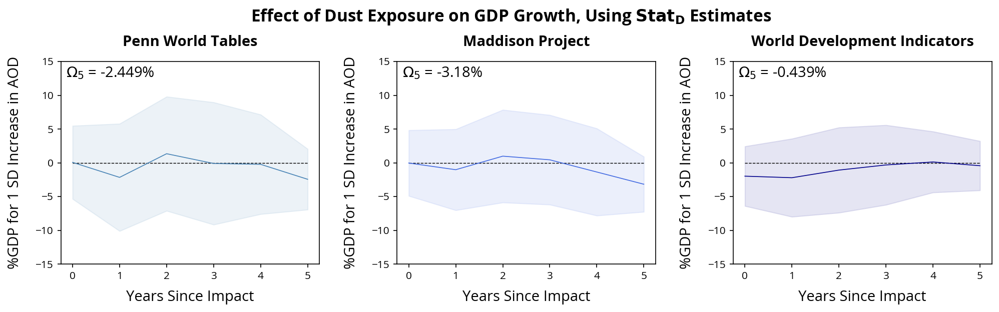

In [37]:
#from functions import plot_stata_input_response

plot_stata_input_response([aod_pwt_aod_response, aod_mpd_aod_response, aod_wbdi_aod_response],
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Dust Exposure on GDP Growth, Using $\mathbf{Stat_{D}}$ Estimates', colors=["steelblue","royalblue", "darkblue"], ylim=[-15,15])

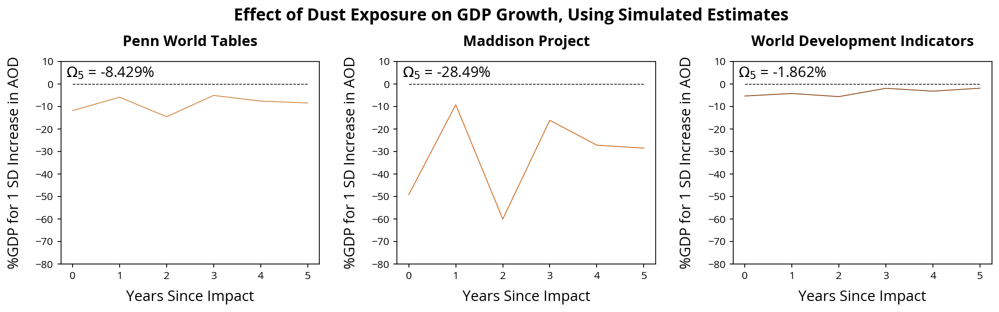

In [38]:
plot_stata_input_response([aod_pwt_sim_aod_response, aod_mpd_sim_aod_response, aod_wbdi_sim_aod_response],
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Dust Exposure on GDP Growth, Using Simulated Estimates', colors=["peru","chocolate", "saddlebrown"], auto_scale=False, ylim=[-80,10], plot_ci=False)

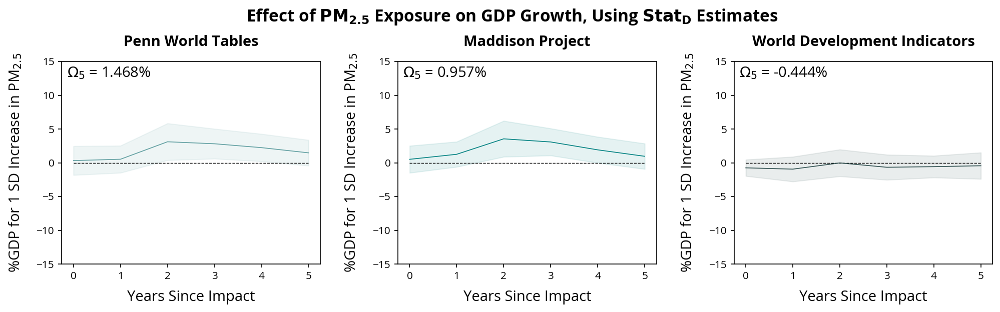

In [39]:
plot_stata_input_response([pm25_pwt_pm25_response, pm25_mpd_pm25_response, pm25_wbdi_pm25_response],
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of $\mathbf{PM_{2.5}}$ Exposure on GDP Growth, Using $\mathbf{Stat_{D}}$ Estimates', colors=["cadetblue","teal", "darkslategrey"], ylim=[-15,15])

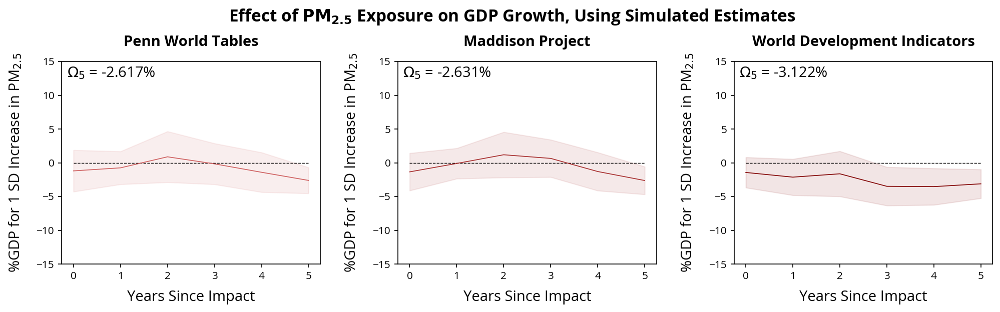

In [40]:
plot_stata_input_response([pm25_pwt_sim_pm25_response, pm25_mpd_sim_pm25_response, pm25_wbdi_sim_pm25_response],
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of $\mathbf{PM_{2.5}}$ Exposure on GDP Growth, Using Simulated Estimates', colors=["indianred","brown", "maroon"], ylim=[-15,15])

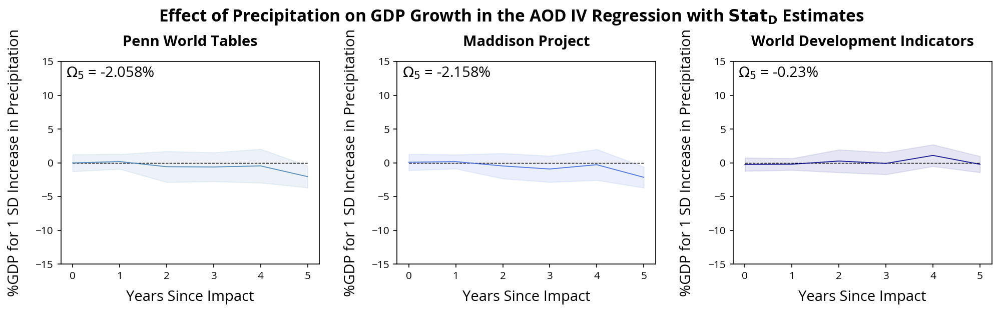

In [41]:
plot_stata_input_response([aod_pwt_prec_response, aod_mpd_prec_response, aod_wbdi_prec_response],
                          y_name= r"%GDP for 1 SD Increase in Precipitation", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Precipitation on GDP Growth in the AOD IV Regression with $\mathbf{Stat_{D}}$ Estimates', colors=["steelblue","royalblue", "darkblue"], ylim=[-15,15])

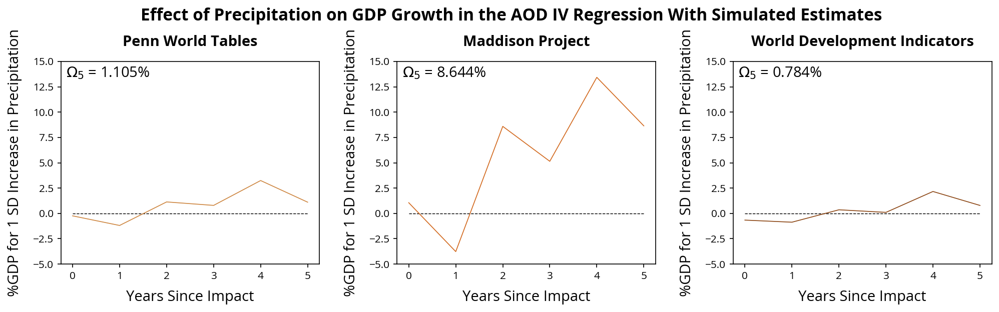

In [42]:
plot_stata_input_response([aod_pwt_sim_prec_response, aod_mpd_sim_prec_response, aod_wbdi_sim_prec_response],
                          y_name= r"%GDP for 1 SD Increase in Precipitation", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Precipitation on GDP Growth in the AOD IV Regression With Simulated Estimates', colors=["peru","chocolate", "saddlebrown"], auto_scale=False, ylim=[-5,15], plot_ci=False)

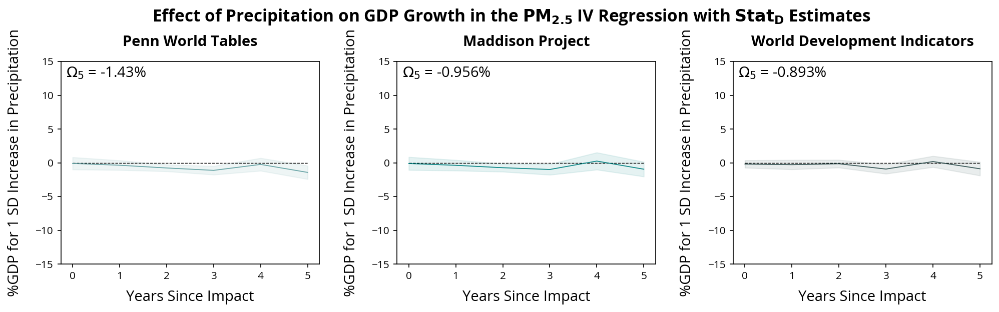

In [43]:
plot_stata_input_response([pm25_pwt_prec_response, pm25_mpd_prec_response, pm25_wbdi_prec_response],
                          y_name= r"%GDP for 1 SD Increase in Precipitation", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Precipitation on GDP Growth in the $\mathbf{PM_{2.5}}$ IV Regression with $\mathbf{Stat_{D}}$ Estimates', colors=["cadetblue","teal", "darkslategrey"], ylim=[-15,15])

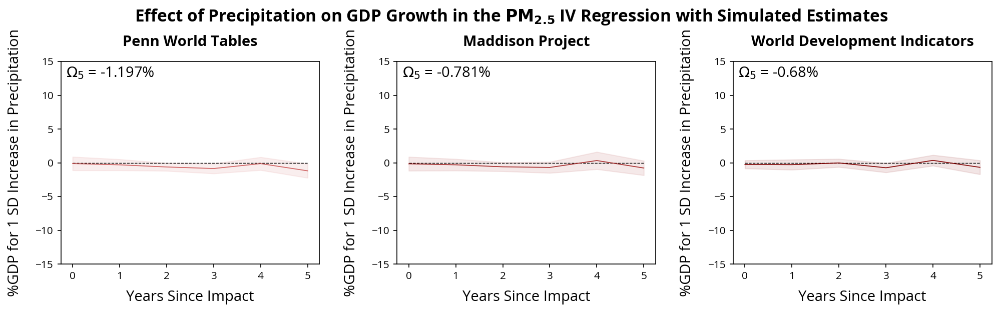

In [44]:
plot_stata_input_response([pm25_pwt_sim_prec_response, pm25_mpd_sim_prec_response, pm25_wbdi_sim_prec_response],
                          y_name= r"%GDP for 1 SD Increase in Precipitation", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Precipitation on GDP Growth in the $\mathbf{PM_{2.5}}$ IV Regression with Simulated Estimates', colors=["indianred","brown", "maroon"], ylim=[-15,15])

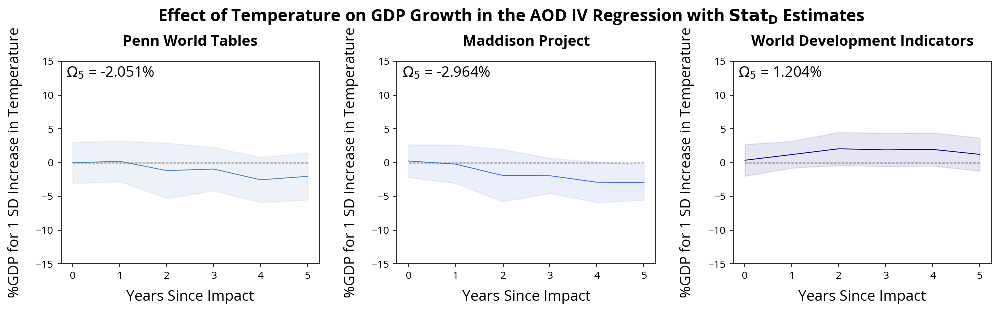

In [45]:
plot_stata_input_response([aod_pwt_temp_response, aod_mpd_temp_response, aod_wbdi_temp_response],
                          y_name= r"%GDP for 1 SD Increase in Temperature", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Temperature on GDP Growth in the AOD IV Regression with $\mathbf{Stat_{D}}$ Estimates', colors=["steelblue","royalblue", "darkblue"], ylim=[-15,15])

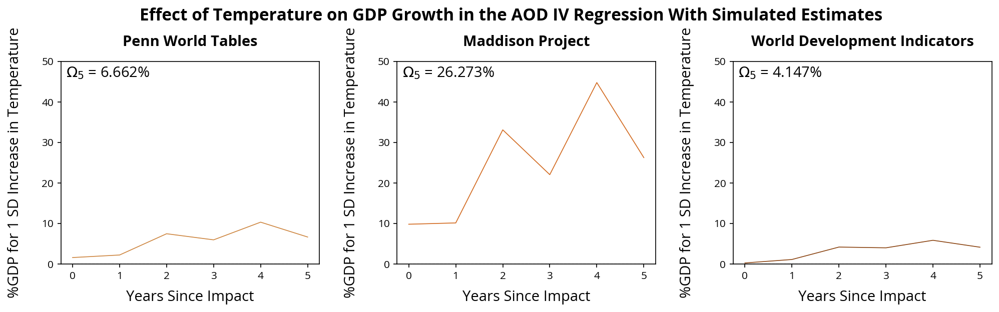

In [46]:
plot_stata_input_response([aod_pwt_sim_temp_response, aod_mpd_sim_temp_response, aod_wbdi_sim_temp_response],
                          y_name= r"%GDP for 1 SD Increase in Temperature", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Temperature on GDP Growth in the AOD IV Regression With Simulated Estimates', colors=["peru","chocolate", "saddlebrown"], auto_scale=False, ylim=[0,50], plot_ci=False)

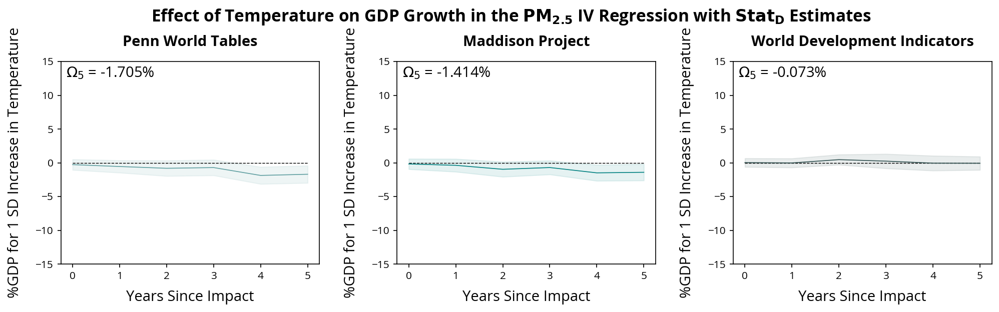

In [47]:
plot_stata_input_response([pm25_pwt_temp_response, pm25_mpd_temp_response, pm25_wbdi_temp_response],
                          y_name= r"%GDP for 1 SD Increase in Temperature", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Temperature on GDP Growth in the $\mathbf{PM_{2.5}}$ IV Regression with $\mathbf{Stat_{D}}$ Estimates', colors=["cadetblue","teal", "darkslategrey"], ylim=[-15,15])

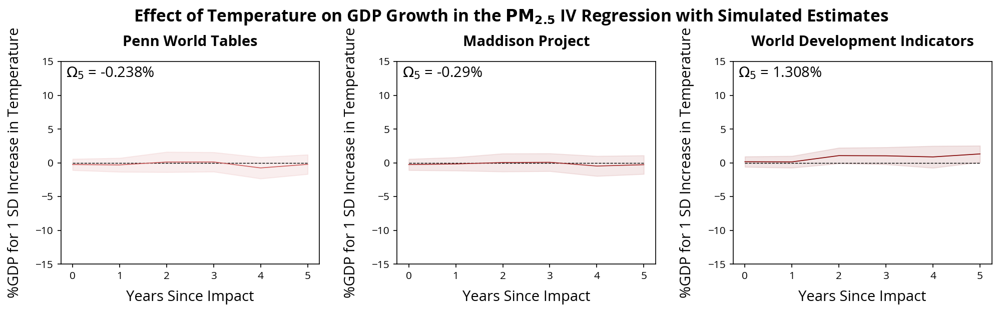

In [48]:
plot_stata_input_response([pm25_pwt_sim_temp_response, pm25_mpd_sim_temp_response, pm25_wbdi_sim_temp_response],
                          y_name= r"%GDP for 1 SD Increase in Temperature", x_name= "Years Since Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Temperature on GDP Growth in the $\mathbf{PM_{2.5}}$ IV Regression with Simulated Estimates', colors=["indianred","brown", "maroon"], ylim=[-15,15])

## Robustness

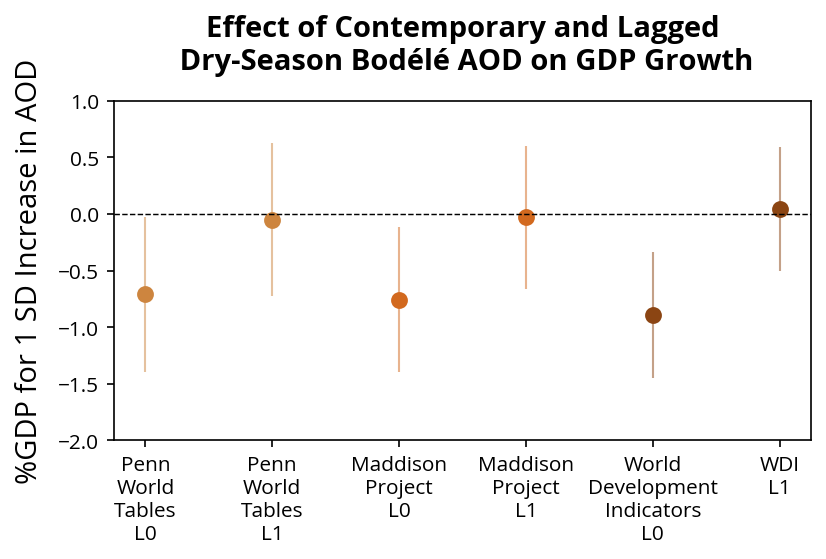

In [49]:
#mache noch plot für contemporary increase

plot_stata_input_response_cont_bodele(aod_bodele_dryl0l1_response,
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables\nL0', 'Penn\nWorld\nTables\nL1', 'Maddison\nProject\nL0','Maddison\nProject\nL1', 'World\nDevelopment\nIndicators\nL0', 'WDI\nL1'],
                          main_title= 'Effect of Contemporary and Lagged\n Dry-Season Bodélé AOD on GDP Growth', colors=["peru","peru", "chocolate","chocolate","saddlebrown", "saddlebrown"], fig_size=(6,3), ylim=[-2,1])

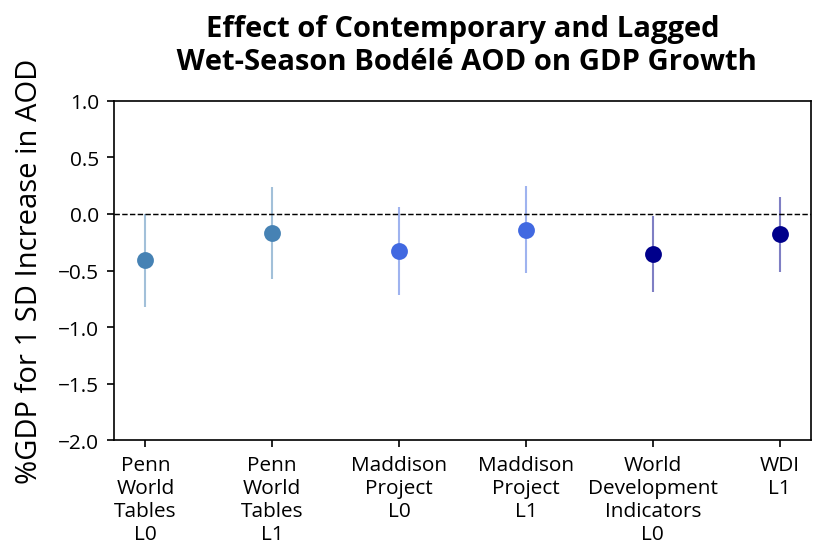

In [50]:
plot_stata_input_response_cont_bodele(aod_bodele_wetl0l1_response,
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables\nL0', 'Penn\nWorld\nTables\nL1', 'Maddison\nProject\nL0','Maddison\nProject\nL1', 'World\nDevelopment\nIndicators\nL0', 'WDI\nL1'],
                          main_title= 'Effect of Contemporary and Lagged\n Wet-Season Bodélé AOD on GDP Growth', colors=["steelblue","steelblue", "royalblue","royalblue","darkblue", "darkblue"], fig_size=(6,3), ylim=[-2,1])

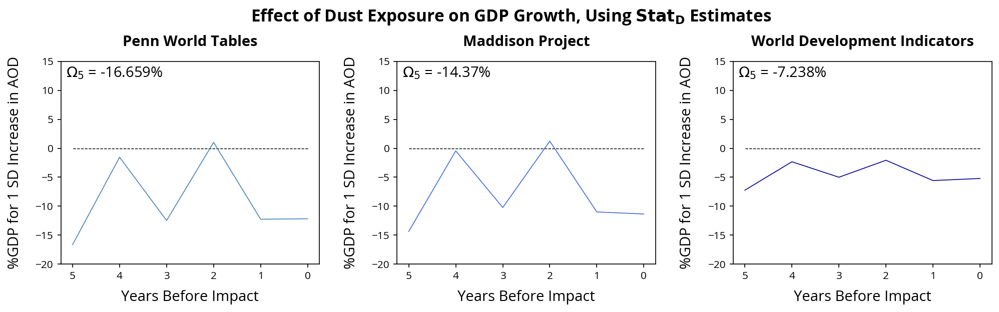

In [51]:

plot_stata_input_response([aod_pwt_backward_response, aod_mpd_backward_response, aod_wbdi_backward_response],
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Years Before Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Dust Exposure on GDP Growth, Using $\mathbf{Stat_{D}}$ Estimates', colors=["steelblue","royalblue", "darkblue"], ylim=[-20,15], plot_ci=False, invert_x_axis=True)

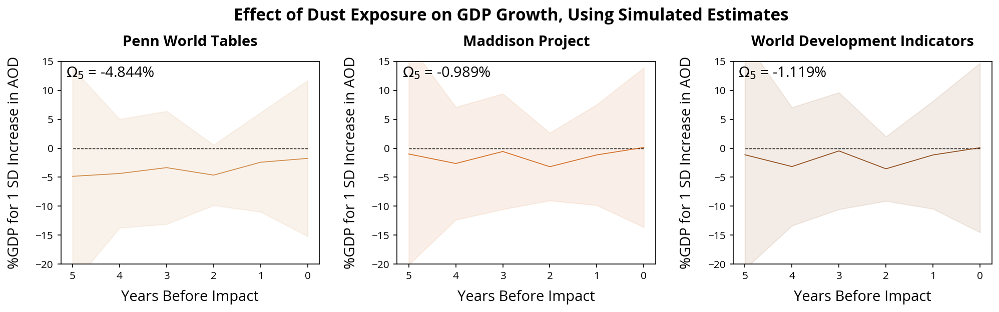

In [52]:
plot_stata_input_response([aod_pwt_backward_response_sim, aod_mpd_backward_response_sim, aod_wbdi_backward_response_sim],
                          y_name= r"%GDP for 1 SD Increase in AOD", x_name= "Years Before Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of Dust Exposure on GDP Growth, Using Simulated Estimates', colors=["peru","chocolate", "saddlebrown"], ylim=[-20,15], invert_x_axis=True)

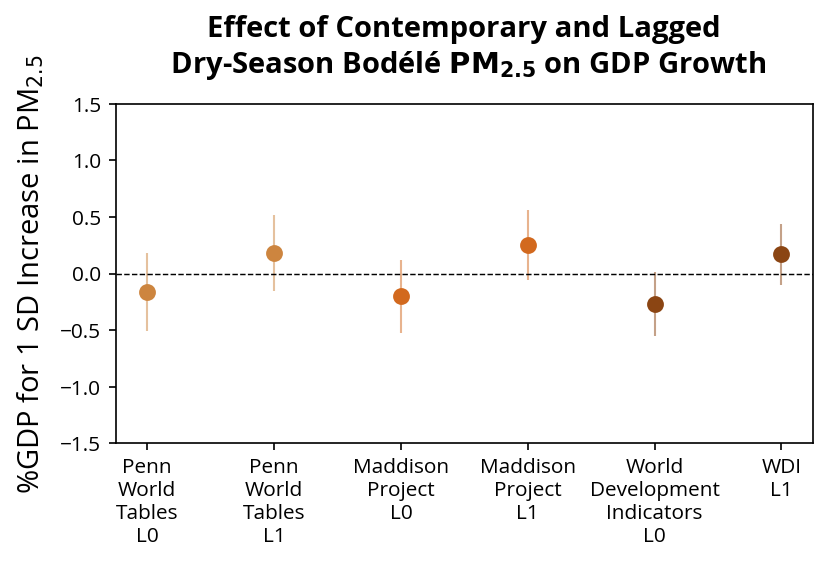

In [53]:
#mache noch plot für contemporary increase

plot_stata_input_response_cont_bodele(pm25_bodele_dryl0l1_response,
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables\nL0', 'Penn\nWorld\nTables\nL1', 'Maddison\nProject\nL0','Maddison\nProject\nL1', 'World\nDevelopment\nIndicators\nL0', 'WDI\nL1'],
                          main_title= 'Effect of Contemporary and Lagged\n Dry-Season Bodélé $\mathbf{PM_{2.5}}$ on GDP Growth', colors=["peru","peru", "chocolate","chocolate","saddlebrown", "saddlebrown"], fig_size=(6,3), ylim=[-1.5,1.5])

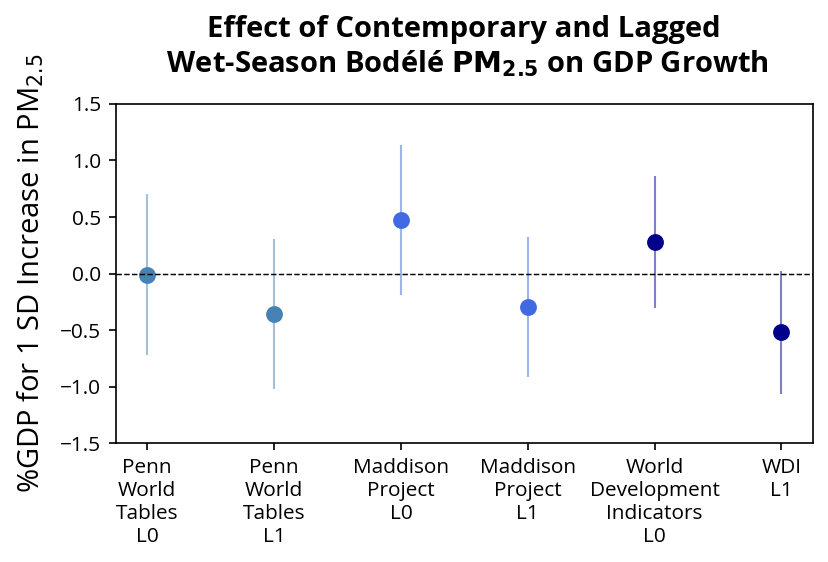

In [54]:
plot_stata_input_response_cont_bodele(pm25_bodele_wetl0l1_response,
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Reaction to Impact",
                          titles = ['Penn\nWorld\nTables\nL0', 'Penn\nWorld\nTables\nL1', 'Maddison\nProject\nL0','Maddison\nProject\nL1', 'World\nDevelopment\nIndicators\nL0', 'WDI\nL1'],
                          main_title= 'Effect of Contemporary and Lagged\n Wet-Season Bodélé $\mathbf{PM_{2.5}}$ on GDP Growth', colors=["steelblue","steelblue", "royalblue","royalblue","darkblue", "darkblue"], fig_size=(6,3), ylim=[-1.5,1.5])

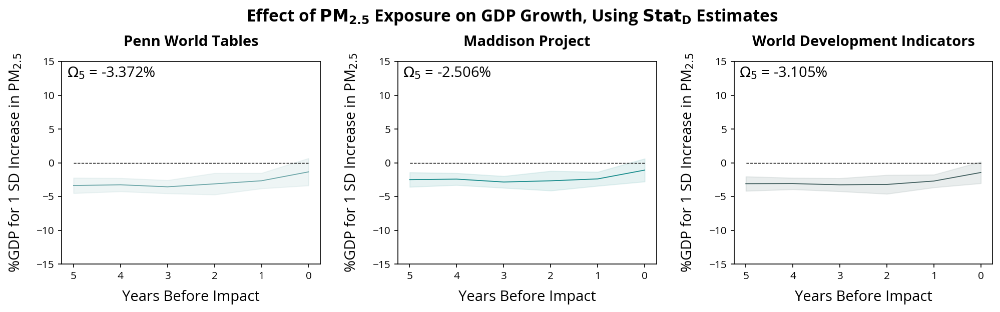

In [55]:
plot_stata_input_response([pm25_pwt_backward_response, pm25_mpd_backward_response, pm25_wbdi_backward_response],
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Years Before Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of $\mathbf{PM_{2.5}}$ Exposure on GDP Growth, Using $\mathbf{Stat_{D}}$ Estimates', colors=["cadetblue","teal", "darkslategrey"], ylim=[-15,15], invert_x_axis=True)

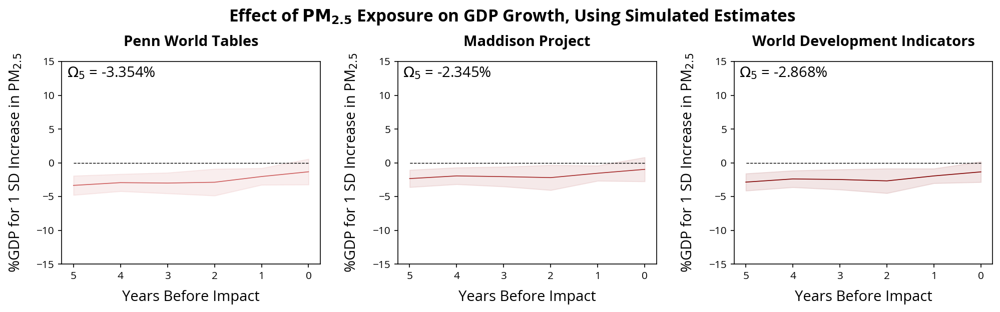

In [56]:
plot_stata_input_response([pm25_pwt_backward_response_sim, pm25_mpd_backward_response_sim, pm25_wbdi_backward_response_sim],
                          y_name= r"%GDP for 1 SD Increase in PM$_{2.5}$", x_name= "Years Before Impact",
                          titles = ['Penn World Tables', 'Maddison Project', 'World Development Indicators'],
                          main_title= r'Effect of $\mathbf{PM_{2.5}}$ Exposure on GDP Growth, Using Simulated Estimates', colors=["indianred","brown", "maroon"], ylim=[-15,15], invert_x_axis=True)

Data Comparison:

In [57]:
growth_country_level_df = pd.read_csv(parent_directory + '\\processed_data\\growth_country_level_df.csv')

pop_df = create_population_df([benin_population_df, burkina_faso_population_df, gambia_population_df,
                                            ghana_population_df, guinea_population_df, liberia_population_df,
                                            mali_population_df, niger_population_df, nigeria_population_df,
                                            senegal_population_df,sierra_leone_population_df,togo_population_df])

#population
wb_population_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\population\\643994bb-1f20-439e-bec8-453374a558c0_Data.csv')

#wb temperature
wb_temp_benin_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_BEN.csv', header = 1)
wb_temp_burkina_faso_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_BFA.csv', header = 1)
wb_temp_gambia_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_GMB.csv', header = 1)
wb_temp_ghana_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_GHA.csv', header = 1)
wb_temp_guinea_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_GIN.csv', header = 1)
wb_temp_liberia_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_LBR.csv', header = 1)
wb_temp_mali_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_MLI.csv', header = 1)
wb_temp_niger_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_NER.csv', header = 1)
wb_temp_nigeria_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_NGA.csv', header = 1)
wb_temp_senegal_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_SEN.csv', header = 1)
wb_temp_sierra_leone_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_SLE.csv', header = 1)
wb_temp_togo_df = pd.read_csv(parent_directory + '\\raw_data\\additional_data\\temperature\\tas_timeseries_annual_cru_1901-2020_TGO.csv', header = 1)


wb_population_df = wb_population_df[['Country Name', '2000 [YR2000]']][:12].transpose()
wb_population_df.columns = wb_population_df.iloc[0]
wb_population_df = wb_population_df[1:]


population_merra_grid_data_list = [pop_df['Benin'].values[0],pop_df['Burkina Faso'].values[0],pop_df['Gambia'].values[0],pop_df['Ghana'].values[0],pop_df['Guinea'].values[0],pop_df['Liberia'].values[0],
                       pop_df['Mali'].values[0],pop_df['Niger'].values[0],pop_df['Nigeria'].values[0],pop_df['Senegal'].values[0],pop_df['Sierra Leone'].values[0],pop_df['Togo'].values[0]]

population_wb_data_list = [int(wb_population_df['Benin'].values[0]),int(wb_population_df['Burkina Faso'].values[0]),int(wb_population_df['Gambia, The'].values[0]),int(wb_population_df['Ghana'].values[0]),int(wb_population_df['Guinea'].values[0]),int(wb_population_df['Liberia'].values[0]),
                           int(wb_population_df['Mali'].values[0]),int(wb_population_df['Niger'].values[0]),int(wb_population_df['Nigeria'].values[0]),int(wb_population_df['Senegal'].values[0]),int(wb_population_df['Sierra Leone'].values[0]),int(wb_population_df['Togo'].values[0])]

temp_merra_grid_data_list = [growth_country_level_df.loc[growth_country_level_df['country']=='benin']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='burkina_faso']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='gambia']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(),
                             growth_country_level_df.loc[growth_country_level_df['country']=='ghana']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='guinea']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='liberia']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(),
                             growth_country_level_df.loc[growth_country_level_df['country']=='mali']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='niger']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='nigeria']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(),
                             growth_country_level_df.loc[growth_country_level_df['country']=='senegal']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='sierra_leone']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean(), growth_country_level_df.loc[growth_country_level_df['country']=='togo']['temp_yr_t-0'].apply(lambda row : float(row)-273.15).mean()]

temp_wb_data_list = [wb_temp_benin_df['Benin'][80:117].mean(), wb_temp_burkina_faso_df['Burkina Faso'][80:117].mean(), wb_temp_gambia_df['Gambia, The'][80:117].mean(), wb_temp_ghana_df['Ghana'][80:117].mean(), wb_temp_guinea_df['Guinea'][80:117].mean(), wb_temp_liberia_df['Liberia'][80:117].mean(),
                     wb_temp_mali_df['Mali'][80:117].mean(), wb_temp_niger_df['Niger'][80:117].mean(), wb_temp_nigeria_df['Nigeria'][80:117].mean(), wb_temp_senegal_df['Senegal'][80:117].mean(), wb_temp_sierra_leone_df['Sierra Leone'][80:117].mean(), wb_temp_togo_df['Togo'][80:117].mean(),]


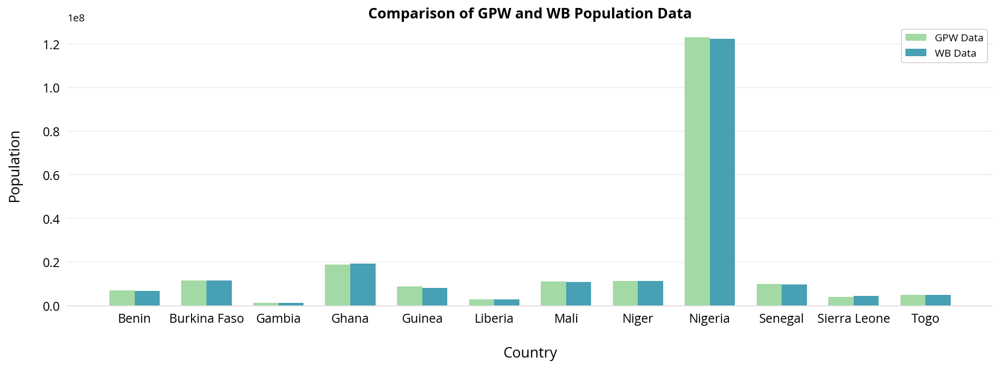

In [58]:
barplot_plausibility(population_merra_grid_data_list, population_wb_data_list, title = 'Comparison of GPW and WB Population Data', xlabels=['Benin', 'Burkina Faso', 'Gambia', 'Ghana', 'Guinea', 'Liberia', 'Mali', 'Niger', 'Nigeria', 'Senegal', 'Sierra Leone','Togo'], ylabel='Population',
            bar_colors = [(0.6334486735870821, 0.8521337946943485, 0.6436755094194541), (0.2800461361014994, 0.6269896193771626, 0.7024221453287197)], legend_text=['GPW Data', 'WB Data'],
            figsize = (16,5), text_size = 14, value_size = 12, ylabelpad = 15, title_pad = 15)

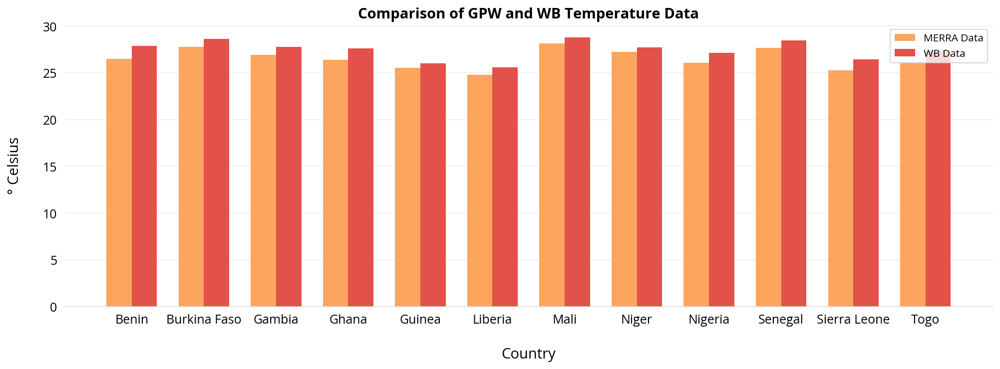

In [59]:
barplot_plausibility(temp_merra_grid_data_list, temp_wb_data_list, title = 'Comparison of GPW and WB Temperature Data', xlabels=['Benin', 'Burkina Faso', 'Gambia', 'Ghana', 'Guinea', 'Liberia', 'Mali', 'Niger', 'Nigeria', 'Senegal', 'Sierra Leone','Togo'], ylabel='° Celsius',
            bar_colors = [(0.9873125720876587, 0.6473663975394078, 0.3642445213379469), (0.8853517877739331, 0.3190311418685121, 0.29042675893886966)], legend_text=['MERRA Data', 'WB Data'],
            figsize = (16,5), text_size = 14, value_size = 12, ylabelpad = 15, title_pad = 15)